In [1]:
# Initialize Otter
import otter
grader = otter.Notebook("hw9.ipynb")

# Homework 9: Predictive Modelling and Model Comparision

Name: Jackson DaPuzzo

Student ID: 500536

Collaborators: Ryan Padala


## Instructions

This is the final homework/Project, which is about Understanding Data Profiling, Feature Engineering, Feature Selection, Model Comparision & Selection as a _final project_ for our 217a class.

We will be using the techniques and approaches introduced throughout the course focusing mainly towards the second half of the semester:

* [M0] Python for DS
* [M1] The DS and ML Workflows
* [M2] Exploratory Data Analsyis
* **[M3] Linear Regression (if applicable - depends on problem/dataset)**
* **[M4] Linear Classification (if applicable - depends on problem/dataset)**
* [M5] Sentiment Analysis (if applicable - depends on problem/dataset)
* [M6] Learning Principles and Ethical Thinking for DS
* **[M7] Clustering K-Means (if applicable - depends on problem/dataset)** 
* **[M8] Similarity-based Learning K-NN (if applicable - depends on problem/dataset)**
* **[M9] More Models (Decision Tree, Random Forest, Neural Network) for Feature Engineering & Model Comparision & Selection**
* **[M10] Creating & Managing Model pipeline for ML workflow**

The main focus of this project is majorly on the last modules [M3]-[M10]. In particular, it will be helpful to review **Lab 3 & hw 3 onwards for more clarification**.
Most of the things you will do in this final project are explained in `Lab9` and `Lab 10`. Then, review the other labs and hws to recap the general workflow of our DS approaches to the various problems we have worked on so far. This will help you to be prepared for all the steps in this project, so that you do not miss anything. 

In gernal, you should feel free to import any package that we have previously used in class. Ensure that all plots have the necessary components that a plot should have (e.g. axes labels, a title, a legend).

Additionally, note that this assignment is more like a project than a typical homework and it will have a slightly different structure than the hws in the past. One of the reasons why Jupyter Notebooks are so popular in the field is because you can really treat them like notebooks to explain your findings as you discover them. In this assignment, we provide some **Problem** stubs following the DS workflow and you will need to fill in the analysis and structure as you go.

Furthermore, in addition to recording your collaborators on this homework, please also remember to cite/indicate all external sources used when finishing this assignment. This includes peers, TAs, and links to online sources. 

Frequently **save** your notebook!

### Collaborators and Sources
Furthermore, in addition to recording your **collaborators** on this homework, please also remember to **cite/indicate all external sources** used when finishing this assignment. 
> This includes peers, TAs, and links to online sources. 

Note that these citations will not free you from your obligation to submit your _own_ code and write-ups, however, they will be taken into account during the grading and regrading process.

In [2]:
# collaborators and sources:
# Albert Einstein and Marie Curie
# https://developers.google.com/edu/python/strings

# your code here
answer = 'my answer'

### Submission instructions
* Submit this Python notebook, including your answers in the code cells as homework submission.
* **Feel free to add as many cells as you need to** — just make sure you don't change what we gave you. 
* **Does it spark joy?** Note that you will be partially graded on the presentation (_cleanliness, clarity, comments_) of your notebook so make sure you [Marie Kondo](https://lifehacker.com/marie-kondo-is-not-a-verb-1833373654) your notebook before submitting it.

<!-- BEGIN QUESTION -->

## 1. Introduction

For our final project this semester, we'll take a look at data for Melbourne Housing Price Prediction
https://www.kaggle.com/datasets/dansbecker/melbourne-housing-snapshot 


As you have seen throughout the semseter we have learned various techniques to solve a problem task (Classification, Regression, Clustering etc.) starting from problem formulation to EDA to model building to model evaluation and performing feaure engineering and selection in order to improve the model's performance.
You will be combining all the knowledge learned so far in this final project. You will be making assuptions and decisions on your own with appropriate justifications in writeups about how to improve the prediction model using all the tools and techniques learned so far and provide the best model at the end.


The project aims at building a model of housing prices to predict median house values in Melbourne using the provided dataset. This model should learn from the data and be able to predict the median housing price in any district, given all the other metrics.

Our goal will be to use this dataset to gain some insight about characteristics of different features.
We will be using data profiling from pandas and create models and compare them to find out which model performed the best and probably explain why it is the best model among all in this data.


### Problem 1.1

Download the data and load it in this notebook for further processing and analysis.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

file = "melb_data.csv"
df = pd.read_csv(file)
df.dtypes
df.columns
df.dtypes
df.info()
df.describe()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


**Write-up!** Describe the data, answering questions including, but not limited to, these: Where does the data come from? How was it obtained? How many examples and features does the dataset have? What kinds of features are in the dataset? What values can these features take? what kind of relationship you would explore in this dataset and on what features? 
> **Hint**: Consider the steps of EDA; what would you like to know about this dataset. 

The given dataset contains information about real estate properties in Melbourne, Australia. The data was obtained from the official website of the Victoria government's data portal.

The dataset consists of 13,580 examples and 21 features that describe attributes of the properties. The features included in the dataset are as follows:

Suburb: Name of the suburb where the property is located
Address: Address of the property
Rooms: Number of rooms in the property
Type: Type of the property (house, apartment, etc.)
Price: Sale price of the property
Method: Method of sale (auction, private treaty, etc.)
SellerG: Real estate agent or agency selling the property
Date: Date of sale
Distance: Distance of the property from Melbourne CBD
Postcode: Postal code of the property
Bedroom2: Scraped number of bedrooms (from different source)
Bathroom: Number of bathrooms
Car: Number of car spaces
Landsize: Land size of the property 
BuildingArea: Building size 
YearBuilt: Year the property was built
CouncilArea: Name of the local council that governs the property
Latitude: Latitude coordinate of the property
Longitude: Longitude coordinate of the property
Regionname: Name of the region where the property is located
Propertycount: Number of properties that exist in the suburb.

The features in the dataset can take on different values depending on the attribute they describe. For example, categorical values; the Suburb feature can take on values such as Abbotsford, Brunswick, Carlton, etc. while the Type feature can take on values such as house, apartment, townhouse, etc. Or numerical values like distance or price.

One relationship that could be explored in this dataset is the relationship between the sale price of a property and its physical features such as the number of rooms, bedrooms, bathrooms, landsize, and building area. We could also explore the relationship between the distance of the property from Melbourne CBD and its sale price, as well as the relationship between the type of property and its sale price.

### Problem 1.2: Getting Familiar with the Data

Generate the data report using __df.profile_report__ as we did in lab 10.

In [4]:
from pandas_profiling import ProfileReport
ProfileReport(df)

/var/folders/hq/34kq2szx2rlfyryn1d1_m32m0000gn/T/ipykernel_19021/2181367630.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Write-up!** What is the Domain/Area of this dataset and what kind of prediction (regression, classification or clustering) we are doing with this dataset and why? Describe the additional insights (if any) you get from generating the pandas data profile report, which you did not observe in the previous EDA steps. Does it change your thinking process or provide any ideas about data pre-processing or processing steps? 

The domain/area of this dataset appears to be real estate. The dataset contains information on various attributes of real estate properties (i.e location, size, number of rooms, etc.)

Based on the features in the dataset, the most appropriate prediction task would be regression. The target variable, "Price," is a continuous variable, and the other features provide information that can be used to predict the price of a property. A regression can be used make predictions about the selling price of a property based on its characteristics.

While classification and clustering are also useful techniques, they may not be appropriate for this dataset. Classification is used when the target variable is categorical. Clustering is used when to group data points based on their similarity without a specific target variable.

In the case of real estate data, the target variable is the price, which is a continuous variable, making regression a more appropriate prediction task.

The data profile report provided a lot of convenient insights that my initial EDA did not shed light on. For example, the correlation matrix gives great data on which variables are correalted with eachtoher and more importantnly, which variables are correlated with price, the likely target variable. Also, the profile report shows us which features are lacking significant data and that will have to be addressed (i.e. BuildingArea, YearBuilt, Council Area)

### Problem 1.3: Data Description

**Write-up!** What are the major highlights and interesting points in the report generated in the previous cell (or your own EDA process). 
Describe your insights and thought process regarding those insightful aspects of the data/features/graph/statistics in terms of general relationship among features such as correlation, interaction, cardinality, distribution, missing data, outliers etc. Include additional visualizations as necessary.

Highlights and interesting points:

1. There are 21 features and 13580 examples in the dataset.

2. The dataset contains a mix of categorical and numerical features. The categorical features include Suburb, Type, Method, SellerG, CouncilArea, and Regionname. The numerical features include Rooms, Price, Distance, Bedroom2, Bathroom, Car, Landsize, BuildingArea, YearBuilt, Lattitude, Longtitude, and Propertycount.

3. The distribution of the target variable "Price" is skewed right, indicating that there are some high-value properties in the dataset.

4. There are several missing values in the dataset, particularly in the BuildingArea and YearBuilt features as well as Council (will need to be addressed).

5. The correlation matrix shows that there are several features that are positively correlated with the target variable "Price", such as Rooms, Bedroom2, Bathroom, Car, Landsize, BuildingArea, and Propertycount.

6. Rooms and Bedroom2 are almost perfectly correlated with each other (needs to be considered when creating the model)

7. BuildingArea has a relatively strong positive correlation with "Price", but it is missing a significant amount of data.


It is also interesting to note that the distribution of numerical features is generally uniform or skewed right, with the exception of YearBuilt, which is skewed left. This suggests that the majority of properties in the dataset were built more recently, which could have implications for their value.

In conclusion, the EDA process provides valuable insights into the relationships between features in the real estate dataset and their potential impact on property prices. Further analysis and modeling can help to refine these insights and develop more accurate predictions.

### Problem 1.4: Split the Data

Extract input (X) and output (y) data from the dataset. 

Use the train and test split from the scikit learn library to split the data into 80% training and 20% testing.

Then, initalize the Kfolds. Be sure to use these folds when executing cross validation below so that the results are comparable.

In [5]:
from sklearn.model_selection import KFold

X = df.loc[:, df.columns !='Price']
y = df['Price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

kf = KFold(n_splits=5, shuffle=True, random_state=42)

**Write-up!** Why 80% train and 20% test split is considered a good practice? How would you pick the train-test split size if the dataset is relatively small or large? What is the purpose of using cross validation technique and how does it ensure model robustness? What is Data snooping and how do you avaoid it?

The 80-20 train-test split is good practice in machine learning because it provides enough data for the model to learn patterns while still keeping a portion to evaluate the model's performance on unseen data.  The specific train-test split size depends on various factors, including the size of the dataset, the complexity of the model, and the desired level of accuracy. For exmaple, If the dataset is small, a larger percentage of data should be allocated to the training set to ensure that the model has enough data to learn patterns. On the flip side, if the dataset is large, a smaller percentage of data can be allocated to the training set.

Cross-validation is a technique used to evaluate the performance of a model by using different subsets of the data for training and testing. This involves dividing the data into multiple folds, where each fold is used for testing while the remaining folds are used for training. The results can be averaged to provide a more reliable estimate of the model's performance.

Data snooping is the practice of using information from the test set to tweak the model during its development . This can lead to overfitting. To avoid data snooping, it's important to use a separate validation set for model tuning and hyperparameter selection and reserve the test set for final evaluation only.

## Problem 2: Baseline Models

#### The use of Scikit-Learn's Pipelines are highly encouraged.

Note that categorical variables will need to be encoded and missing values should be appropriately delt with using imputation. Also, some models may require scaling. Imputation and scaling should be done in a manner that aovids data snooping.

In [6]:
print(df.isnull().sum())

for dataset in [X_train, X_test]:
    dataset.drop('YearBuilt', axis=1, inplace=True)
    dataset.drop('SellerG', axis=1, inplace=True)
    dataset.drop('Date', axis=1, inplace=True)
    dataset.drop('Lattitude', axis=1, inplace=True)
    dataset.drop('Longtitude', axis=1, inplace=True)
    dataset.drop('Address', axis=1, inplace=True)
    dataset.drop('Suburb', axis=1, inplace=True)
X_train.head()
    

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                62
Landsize            0
BuildingArea     6450
YearBuilt        5375
CouncilArea      1369
Lattitude           0
Longtitude          0
Regionname          0
Propertycount       0
dtype: int64


,Rooms,Type,Method,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,CouncilArea,Regionname,Propertycount
12796,4,h,S,14.2,3149.0,4.0,2.0,2.0,695.0,160.0,NaN,Eastern Metropolitan,13366.0
9642,3,h,S,14.2,3149.0,3.0,1.0,2.0,810.0,NaN,Monash,Eastern Metropolitan,13366.0
3207,2,u,S,4.6,3122.0,2.0,1.0,1.0,82.0,NaN,Boroondara,Southern Metropolitan,11308.0
1698,2,u,S,3.2,3054.0,2.0,1.0,1.0,0.0,76.0,Yarra,Northern Metropolitan,3106.0
761,4,h,S,13.0,3204.0,4.0,2.0,1.0,292.0,NaN,Glen Eira,Southern Metropolitan,6795.0


In [7]:
X_train.dtypes

Rooms              int64
Type              object
Method            object
Distance         float64
Postcode         float64
Bedroom2         float64
Bathroom         float64
Car              float64
Landsize         float64
BuildingArea     float64
CouncilArea       object
Regionname        object
Propertycount    float64
dtype: object

In [8]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
np.random.seed(42)

cat_cols = ['Type', 'Method', 'CouncilArea','Regionname']
cat_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse=False))
])

In [9]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import RobustScaler

num_cols = ['Rooms', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car', 'Landsize', 'BuildingArea', 'Propertycount']

num_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5)),
    ('scaler', RobustScaler())
])

In [10]:
from sklearn.compose import ColumnTransformer

preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, num_cols),
        ('cat', cat_transformer, cat_cols)
    ])

### Problem 2.1: Perform Linear Regression

Perform Linear Regression on training data. Predict the output for the test dataset using the fitted model. Print the root mean squared error (RMSE) and R^2 value from Linear Regression for test data set.


In [11]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
scores_base = np.zeros(4)
scores_ex1=np.zeros(3)

pipeline_LR = Pipeline(steps=[('preprocessor', preprocessor), ('regression', LinearRegression())])

pipeline_LR.fit(X_train, y_train)
y_pred_train = pipeline_LR.predict(X_train)
y_pred_test = pipeline_LR.predict(X_test)

rmse=np.sqrt(mean_squared_error(y_pred_test,y_test))
r2=r2_score(y_pred_test,y_test)
scores_base[0]=r2

print('RMSE:', rmse)
print('R^2:', r2)

RMSE: 378705.8641633954
R^2: 0.45292395947925557


**Write-up!** Why do we use R^2 values when we have other error measures (MAE, MSE, RMSE etc.)?

R-squared is a measure of how well a linear regression model fits the data, and it has some advantages over other error measures because it can be used for model comparison and is independent of the data scale. However, it should not be used as the sole factors for evaluating a  model.

### Problem 2.2 : Perform K-Nearest Neighbors Regression

Perform K-Nearest Neighbors Algorithm for Regression using cross validation to tune any hyperparameters, such as `n_neighbors`.

Then, using the optimal hyperparameters, train a K-Nearest Neighbors Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from K-Nearest Neighbors Regression on the test datset.

In [12]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV


knn = KNeighborsRegressor()

param_grid = {'n_neighbors': [3, 5, 7, 9]}

knn_cv = GridSearchCV(knn, param_grid, cv=5)
knn_cv.fit(preprocessor.transform(X_train), y_train)

knn_reg = KNeighborsRegressor(n_neighbors=knn_cv.best_params_['n_neighbors'])
knn_reg.fit(preprocessor.transform(X_train), y_train)

y_pred_test = knn_reg.predict(preprocessor.transform(X_test))

rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)
scores_base[1]=r2
scores_ex1[0]=r2

print('RMSE:', rmse)
print('R^2:', r2)


RMSE: 321054.5356656535
R^2: 0.7405024678255364


**Write-up!** How K-NN is different than Linear regression model and what additional steps you have to take for KNN Regression?

Linear Regression is a supervised learning algorithm that models the relationship between a dependent variable and one or more independent variables using a linear function. The goal of linear regression is to find the best-fit line that minimizes the sum of squared errors between the predicted and actual values.

K-NN, on the other hand, is a non-parametric and instance-based algorithm that makes predictions based on the similarities between a new data point and the existing data points in the training set. The K-NN algorithm finds the k nearest neighbors to the new data point and averages their target values to make a prediction.

For KNN Regression, the additional steps include scaling the data and determining the optimal value of K through cross-validation. Scaling is important because K-NN is based on distance measures, and features with large scales can dominate the distance metric. Also, KNN requires a metric to calculate the distance between instances, and the choice of metric can affect the performance of the algorithm.

### Problem 2.3 : Perform Decision Tree Regression 

Perform Decision Tree Regression using cross validation to tune any hyperparameters, such as `max_depth`.

Then, using the optimal hyperparameters, train a Decision Tree Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Decision Tree Regression on the test dataset.

In [13]:
from sklearn.tree import DecisionTreeRegressor


dt = DecisionTreeRegressor(random_state=42)

param_grid = {'max_depth': [3, 5, 7, 9]}

dt_cv = GridSearchCV(dt, param_grid, cv=5)
dt_cv.fit(preprocessor.transform(X_train), y_train)

dt_reg = DecisionTreeRegressor(max_depth=dt_cv.best_params_['max_depth'], random_state=42)
dt_reg.fit(preprocessor.transform(X_train), y_train)

y_pred_test = dt_reg.predict(preprocessor.transform(X_test))

rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)
scores_base[2]=r2
scores_ex1[1]=r2

print('RMSE:', rmse)
print('R^2:', r2)


RMSE: 373802.0812760213
R^2: 0.6482298023052114


**Write-up!** What are the advantages or disadvantages of using Decision Tree over Linear regression and KNN?

Decision Trees have advantages over Linear Regression and K-NN because they are easy to understand and interpret, can handle both categorical and numerical data, and are non-parametric. They can capture nonlinear relationships between features and have low bias but high variance, which can be reduced through techniques like pruning. However, they can overfit the training data and may not generalize well to new data.

### Problem 2.4 : Perform Random Forest Regression

Perform Random Forest Regression using cross validation to tune any hyperparameters, such as `n_estimators`.

Then, using the optimal hyperparameters, train a Random Forest Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Random Forest Regression on the test dataset.

In [14]:
from sklearn.ensemble import RandomForestRegressor


rf = RandomForestRegressor(random_state=42)

param_grid = {'n_estimators': [5, 10, 15]}

rf_cv = GridSearchCV(rf, param_grid, cv=5)
rf_cv.fit(preprocessor.transform(X_train), y_train)

rf_reg = RandomForestRegressor(n_estimators=rf_cv.best_params_['n_estimators'], random_state=42)
rf_reg.fit(preprocessor.transform(X_train), y_train)

y_pred_test = rf_reg.predict(preprocessor.transform(X_test))

rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)
scores_base[3]=r2
scores_ex1[2]=r2

print('RMSE:', rmse)
print('R^2:', r2)


RMSE: 289321.022480028
R^2: 0.7892655223492093


**Write-up!** How Random Forest ensures better results from Decision Tree and Why? 

Random Forest combines multiple decision trees to improve performance and mitigate overfitting. By randomizing the features and observations used in each tree, it decreases correlation between trees thus improving diversity. By combining the predictions of all trees, it makes the model better. This can lead to better results compared to a single Decision Tree.

## 3. Feature Selection / Extraction

### Problem 3.1: Feature Selection

Identify features which needs feature engineering after looking at the baseline models' results. Perform Feature **selection** in this step and use this knowledge in predictive modeling part. Apply some feature selection techniques below (Statistical, Model-based, or Iterative Feature Selection). Be sure to apply the same Feature Selection to both the training and testing datasets.

**Do this!** In the cells below, **explain** and perform the steps necessary for feature selection. Make sure that your implementations and write-ups are presented well and effectively describe your workflow. You may add comments or markdown cells for your documentation as you see fit!  

*Grading Note: Your work will be graded for _readability_, _style_, and _cleanlines_. So, carefully document your code and use descriptive/intuitive variable names. For write-ups use consice and clear language like in a written project report.*

> **Hint**: You can use our previous labs as examples of how you might do this. Remember, you may add as many cells (for code and text) as you need below. Here — we gave you one for free!

In [15]:
# First, I create a dataframe of all the features and their correlation to price, from the profile report
correlations = pd.DataFrame({"Rooms": [0.540], "Price": [1.000], "Distance": [-0.130], "Postcode": [0.230], "Bedroom2": [0.524], "Bathroom": [0.427], "Car": [0.288], "Landsize": [0.327], "BuildingArea": [0.631], "YearBuilt": [-0.368], "Latitude": [-0.260], "Longitude": [0.262], "PropertyCount": [-0.011], "Type": [0.304], "Method": [0.063], "Date": [0.048], "CouncilArea": [0.170], "RegionName": [0.141]})
mask = abs(correlations) > 0.4

# Use boolean indexing to return a new DataFrame containing only the relevant columns (columns with a correlation coefficient > 0.4)
filtered_correlations = correlations.loc[:, mask.any()]


X_train_filtered, X_test_filtered = X_train[["Rooms", "Bedroom2", "Bathroom", "BuildingArea"]], X_test[["Rooms", "Bedroom2", "Bathroom", "BuildingArea"]]
X_train_filtered, X_test_filtered

(       Rooms  Bedroom2  Bathroom  BuildingArea
 12796      4       4.0       2.0         160.0
 9642       3       3.0       1.0           NaN
 3207       2       2.0       1.0           NaN
 1698       2       2.0       1.0          76.0
 761        4       4.0       2.0           NaN
 ...      ...       ...       ...           ...
 5191       3       3.0       1.0           NaN
 13418      2       2.0       1.0          93.0
 5390       3       3.0       1.0           NaN
 860        2       2.0       2.0          79.0
 7270       3       3.0       1.0         147.0
 
 [10864 rows x 4 columns],
        Rooms  Bedroom2  Bathroom  BuildingArea
 1061       3       3.0       2.0           NaN
 6482       2       2.0       1.0          83.0
 8395       3       3.0       1.0         115.0
 4659       3       3.0       2.0         106.0
 7386       2       2.0       1.0           NaN
 ...      ...       ...       ...           ...
 10455      3       3.0       1.0         145.0
 3616      

**Write up** Explain which feature selection method have you selected and why for this dataset.

I have selected statistical feature selection for this dataset because having data on the correlation between features gave me a very clear representation of which features actually have an impact on our target feature, Price.

### Problem 3.2: Feature Extraction

Identify features which needs feature engineering after looking at the baseline models' results. Perform Feature **extraction** in this step and use this knowledge in predictive modeling part. Apply some feature extraction techniques below. Be sure to apply the same feature extraction to both the training and testing datasets.

**Do this!** In the cells below, **explain** and perform the steps necessary for feature extraction. Make sure that your implementations and write-ups are presented well and effectively describe your workflow. You may add comments or markdown cells for your documentation as you see fit!  

*Grading Note: Your work will be graded for _readability_, _style_, and _cleanlines_. So, carefully document your code and use descriptive/intuitive variable names. For write-ups use consice and clear language like in a written project report.*

> **Hint**: You can use our previous labs as examples of how you might do this. Remember, you may add as many cells (for code and text) as you need below. Here — we gave you one for free!

I do not need to do any feature extraction. This is because we will be using all of the data from above and cannot create any new features from what we currently have without losing the value of the original features. 

**Write up** Explain which feature extraction/generation method have you selected and why for this dataset.

**Your Answer Here:**

## Problem 4: Feature Engineered Models

#### The use of Scikit-Learn's Pipelines are highly encouraged.

Note that categorical variables will need to be encoded and missing values should be appropriately delt with using imputation. Also, some models may require scaling. Imputation and scaling should be done in a manner that aovids data snooping.

In [16]:
X_train_filtered.dtypes

Rooms             int64
Bedroom2        float64
Bathroom        float64
BuildingArea    float64
dtype: object

In [17]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import RobustScaler

num_cols = ['Rooms','Bedroom2', 'Bathroom', 'BuildingArea']

num_transformer = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors=5)),
    ('scaler', RobustScaler())
])

In [18]:
from sklearn.compose import ColumnTransformer

preprocessor2 = ColumnTransformer(
    transformers=[
        ('num', num_transformer, num_cols)
    ])

### Problem 4.1: Perform Linear Regression

Perform Linear Regression on **engineered training data**. Predict the output for the test dataset using the fitted model. Print the root mean squared error (RMSE) and R^2 value from Linear Regression for test data set.


In [19]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
scores_new = np.zeros(4)
scores_ex2=np.zeros(3)
pipeline_LR = Pipeline(steps=[('preprocessor', preprocessor2), ('regression', LinearRegression())])

pipeline_LR.fit(X_train_filtered, y_train)
y_pred_train = pipeline_LR.predict(X_train_filtered)
y_pred_test = pipeline_LR.predict(X_test_filtered)

rmse=np.sqrt(mean_squared_error(y_pred_test,y_test))
r2=r2_score(y_pred_test,y_test)
scores_new[0]=r2

print('RMSE:', rmse)
print('R^2:', r2)

RMSE: 524498.4092404967
R^2: -1.3115173396926503


### Problem 4.2 : Perform K-Nearest Neighbors Regression

Perform K-Nearest Neighbors Algorithm for Regression using cross validation to tune any hyperparameters, such as `n_neighbors`. Be sure to use the **data with feature engineering applied**.

Then, using the optimal hyperparameters, train a K-Nearest Neighbors Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from K-Nearest Neighbors Regression on the test datset.

In [20]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV

knn = KNeighborsRegressor()

param_grid = {'n_neighbors': [3, 5, 7, 9]}

knn_cv = GridSearchCV(knn, param_grid, cv=5)
knn_cv.fit(preprocessor2.transform(X_train_filtered), y_train)

knn_reg = KNeighborsRegressor(n_neighbors=knn_cv.best_params_['n_neighbors'])
knn_reg.fit(preprocessor2.transform(X_train_filtered), y_train)

y_pred_test = knn_reg.predict(preprocessor2.transform(X_test_filtered))

rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)
scores_new[1]=r2
scores_ex2[0]=r2

print('RMSE:', rmse)
print('R^2:', r2)

RMSE: 538256.4918827544
R^2: 0.27061947084694504


### Problem 4.3 : Perform Decision Tree Regression 

Perform Decision Tree Regression using cross validation to tune any hyperparameters, such as `max_depth`. Be sure to use the **data with feature engineering applied.**

Then, using the optimal hyperparameters, train a Decision Tree Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Decision Tree Regression on the test dataset.

In [21]:
from sklearn.tree import DecisionTreeRegressor

dt = DecisionTreeRegressor(random_state=42)

param_grid = {'max_depth': [3, 5, 7, 9]}

dt_cv = GridSearchCV(dt, param_grid, cv=5)
dt_cv.fit(preprocessor2.transform(X_train_filtered), y_train)

dt_reg = DecisionTreeRegressor(max_depth=dt_cv.best_params_['max_depth'], random_state=42)
dt_reg.fit(preprocessor2.transform(X_train_filtered), y_train)

y_pred_test = dt_reg.predict(preprocessor2.transform(X_test_filtered))

rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)
scores_new[2]=r2
scores_ex2[1]=r2

print('RMSE:', rmse)
print('R^2:', r2)

RMSE: 510916.00432648975
R^2: 0.3428346951763853


### Problem 4.4 : Perform Random Forest Regression

Perform Random Forest Regression using cross validation to tune any hyperparameters, such as `n_estimators`. Be sure to use the **data with feature engineering applied.**

Then, using the optimal hyperparameters, train a Random Forest Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Random Forest Regression on the test dataset.

In [22]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(random_state=42)

param_grid = {'n_estimators': [5, 10, 15]}

rf_cv = GridSearchCV(rf, param_grid, cv=5)
rf_cv.fit(preprocessor2.transform(X_train_filtered), y_train)

rf_reg = RandomForestRegressor(n_estimators=rf_cv.best_params_['n_estimators'], random_state=42)
rf_reg.fit(preprocessor2.transform(X_train_filtered), y_train)

y_pred_test = rf_reg.predict(preprocessor2.transform(X_test_filtered))

rmse = mean_squared_error(y_test, y_pred_test, squared=False)
r2 = r2_score(y_test, y_pred_test)
scores_new[3]=r2
scores_ex2[2]=r2

scores = np.concatenate((scores_base, scores_new))
scores_ex=np.concatenate((scores_ex1, scores_ex2))
print('RMSE:', rmse)
print('R^2:', r2)
print(scores_base)
print(scores_new)
print(scores)
print(scores_ex)

RMSE: 528318.2847341875
R^2: 0.29730494760305215
[0.45292396 0.74050247 0.6482298  0.78926552]
[-1.31151734  0.27061947  0.3428347   0.29730495]
[ 0.45292396  0.74050247  0.6482298   0.78926552 -1.31151734  0.27061947
  0.3428347   0.29730495]
[0.74050247 0.6482298  0.78926552 0.27061947 0.3428347  0.29730495]


## 5. Model Comparision

### Problem 5.1:

Compare all the models results using either $R^{2}$ or RMSE. Be sure to include the following visualizations:
1. A bar chart comparison of the 4 baseline models from problem 2.
2. A bar chart comparison of the 4 feature engineered models from problem 4.
3. A bar chat comparision of the 4 baseline models + the 4 feature engineered models.

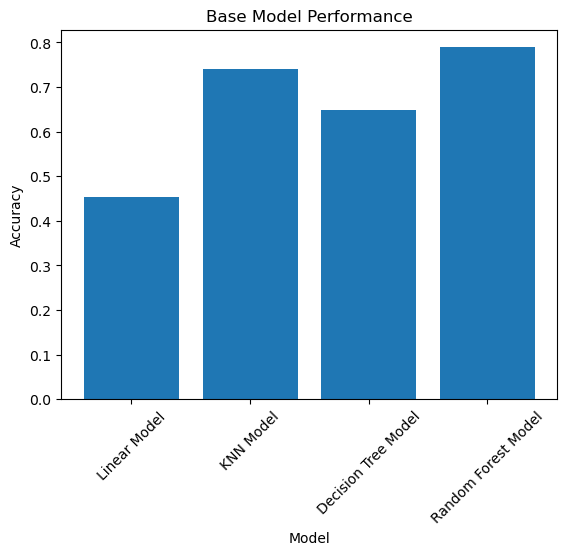

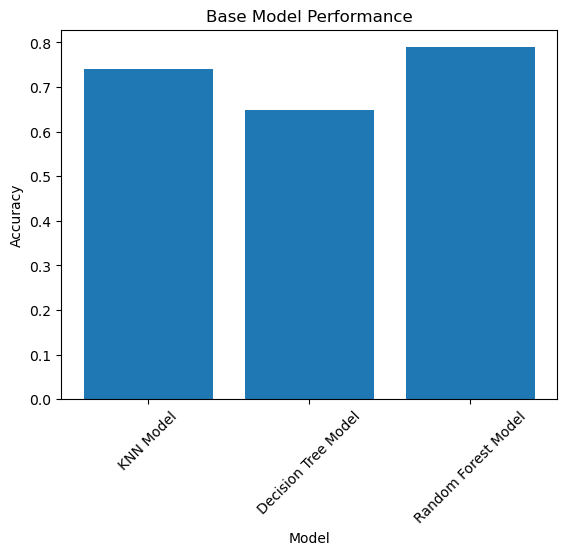

In [23]:
import matplotlib.pyplot as plt
%matplotlib inline

labels = ['Linear Model', 'KNN Model', 'Decision Tree Model', 'Random Forest Model']


plt.bar(labels, scores_base)


plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Base Model Performance')
plt.xticks(rotation=45)

plt.show()

labels_ex1 = ['KNN Model', 'Decision Tree Model', 'Random Forest Model']

plt.bar(labels_ex1, scores_ex1)


plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Base Model Performance')
plt.xticks(rotation=45)

plt.show()


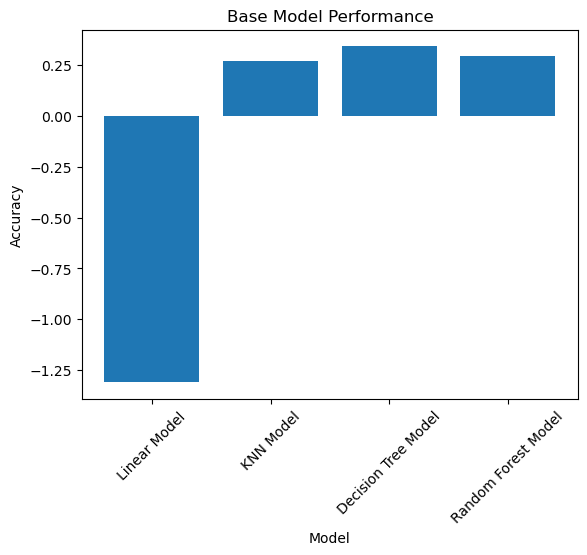

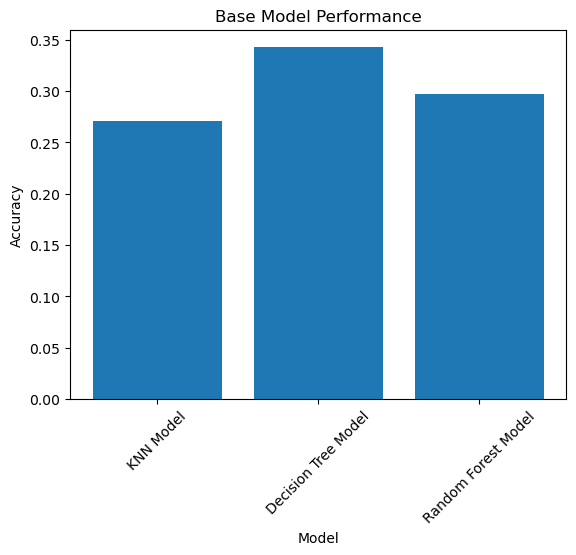

In [24]:
import matplotlib.pyplot as plt


labels = ['Linear Model', 'KNN Model', 'Decision Tree Model', 'Random Forest Model']


plt.bar(labels, scores_new)


plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Base Model Performance')
plt.xticks(rotation=45)

plt.show()


labels_ex2 = ['KNN Model', 'Decision Tree Model', 'Random Forest Model']

plt.bar(labels_ex2, scores_ex2)


plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Base Model Performance')
plt.xticks(rotation=45)

plt.show()



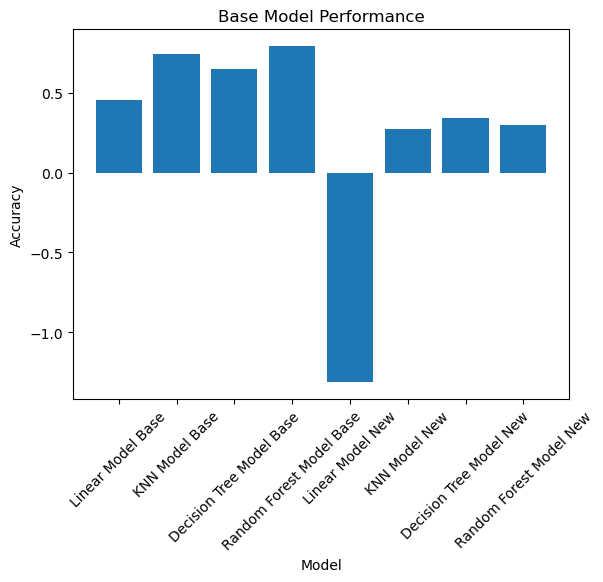

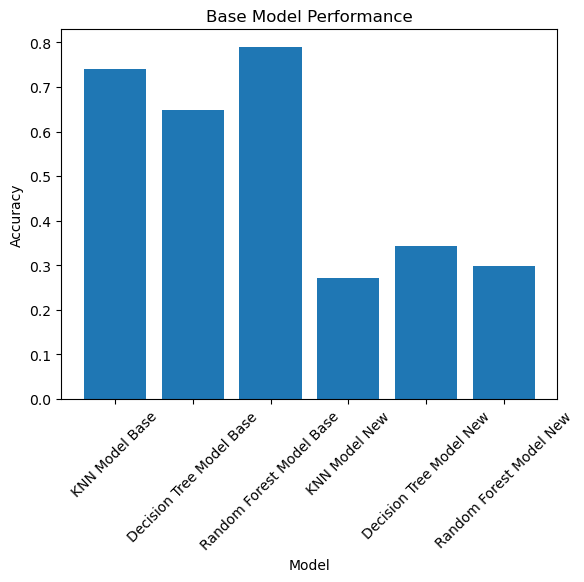

In [25]:
import matplotlib.pyplot as plt


labels = ['Linear Model Base', 'KNN Model Base', 'Decision Tree Model Base', 'Random Forest Model Base', 'Linear Model New', 'KNN Model New', 'Decision Tree Model New', 'Random Forest Model New']


plt.bar(labels, scores)


plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Base Model Performance')
plt.xticks(rotation=45)

plt.show()


labels_ex = ['KNN Model Base', 'Decision Tree Model Base', 'Random Forest Model Base', 'KNN Model New', 'Decision Tree Model New', 'Random Forest Model New']

plt.bar(labels_ex, scores_ex)


plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Base Model Performance')
plt.xticks(rotation=45)

plt.show()



The reason I have 2 bar plots for each grouping of model is becasue of an error with the r2 value for the linear model the second time. Since it is negative it is ruining the scale of the bar plots and not painting an accurate picture. This is why i removed the linear model for the second plot in every grouping. The reason for it being negative could be becasue the model really does not fit (it is essenatially worse fitting than a horizontal line)

### Problem 5.2:

**Write up** Summarize your results and provide some crucial insights about the entire with and without feature engineering process such as which model performed the best and why, based on what metrics and indicators, etc. Which feature engineering step provided more value to the predictive modeling process?

In one case, the second, the decision tree model seemed to have been the most accurate for the data. This is based on the graph of the r2 values. The he RMSE is also the lowest for decision tree. So, with both the r2 being the highest and the rmse being the lowest, it would be safe to say that the best model in this case comes from the decision tree. However, the first time showed RF model for being the best which makes sense generally as it is known to be a better model in large. It was also helpful while feature engineering to remove the values with low magnitude of correlation as they could prove to hurt the model.

In [26]:
grader.check("hw9")

hw9 results: All test cases passed!

<!-- END QUESTION -->

Note that we have a dummy test here to generate a pdf on Gradescope, but the entire assignment is manually graded. So make sure your notebook communicates your thoughts and process!

---

To double-check your work, the cell below will rerun all of the autograder tests.

In [27]:
grader.check_all()

hw9 results: All test cases passed!

## Submission

Make sure you have run all cells in your notebook in order before running the cell below, so that all images/graphs appear in the output. The cell below will generate a zip file for you to submit. **Please save before exporting!**

In [28]:
# Save your notebook first, then run this cell to export your submission.
grader.export(pdf=False)